In [1]:
import cv2
print(cv2.__version__)

4.10.0


In [2]:
import matplotlib.pyplot as plt

In [4]:
# defining imshow function

def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

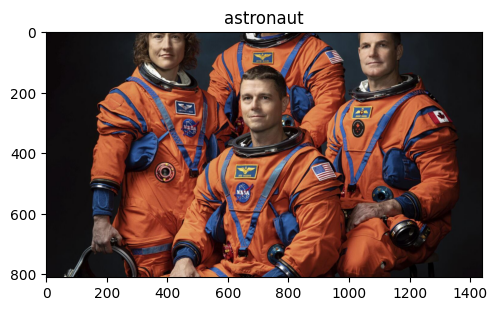

In [4]:
image = cv2.imread('/content/astronaut.jpeg')
imshow('astronaut', image)

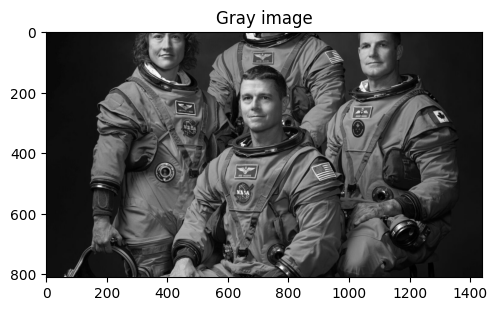

In [5]:
# converting image to gray scale

gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
imshow('Gray image', gray_image)

In [6]:
image.shape

(810, 1440, 3)

In [7]:
gray_image.shape

(810, 1440)

In [8]:
# get individual color space

B, G, R = cv2.split(image)
print(B.shape)
print(G.shape)
print(R.shape)

(810, 1440)
(810, 1440)
(810, 1440)


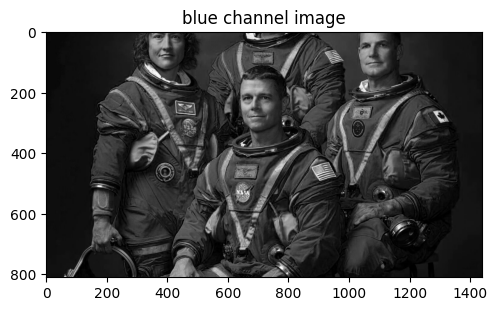

In [9]:
imshow("blue channel image", B)

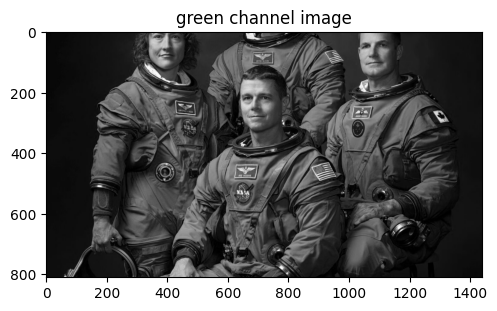

In [10]:
imshow("green channel image", G)

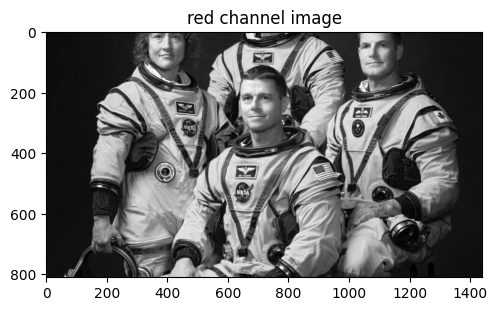

In [11]:
imshow("red channel image", R)

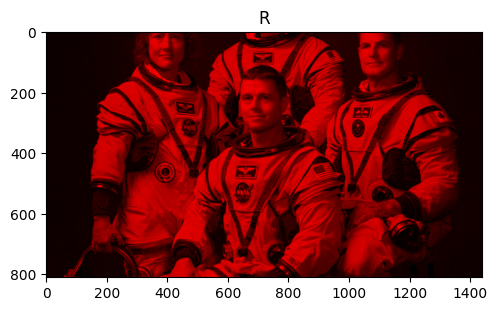

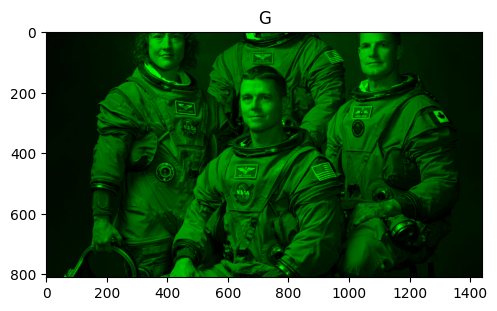

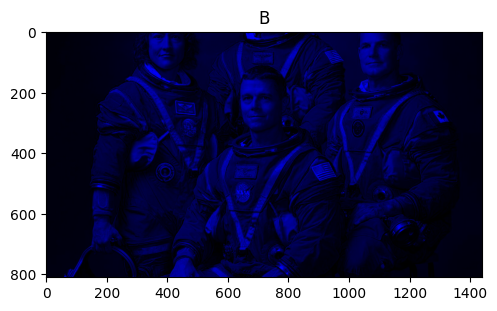

In [12]:
import numpy as np

zeros = np.zeros(image.shape[:2], dtype = "uint8")
imshow("R", cv2.merge([zeros, zeros, R]))
imshow("G", cv2.merge([zeros, G, zeros]))
imshow("B", cv2.merge([B, zeros, zeros]))

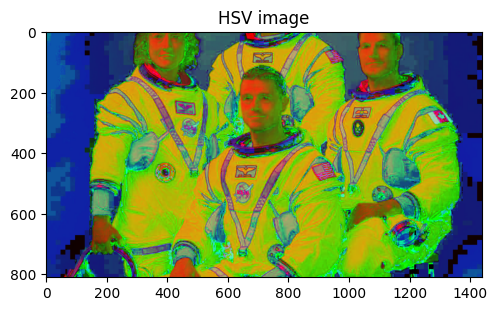

In [13]:
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
imshow("HSV image", hsv_image)

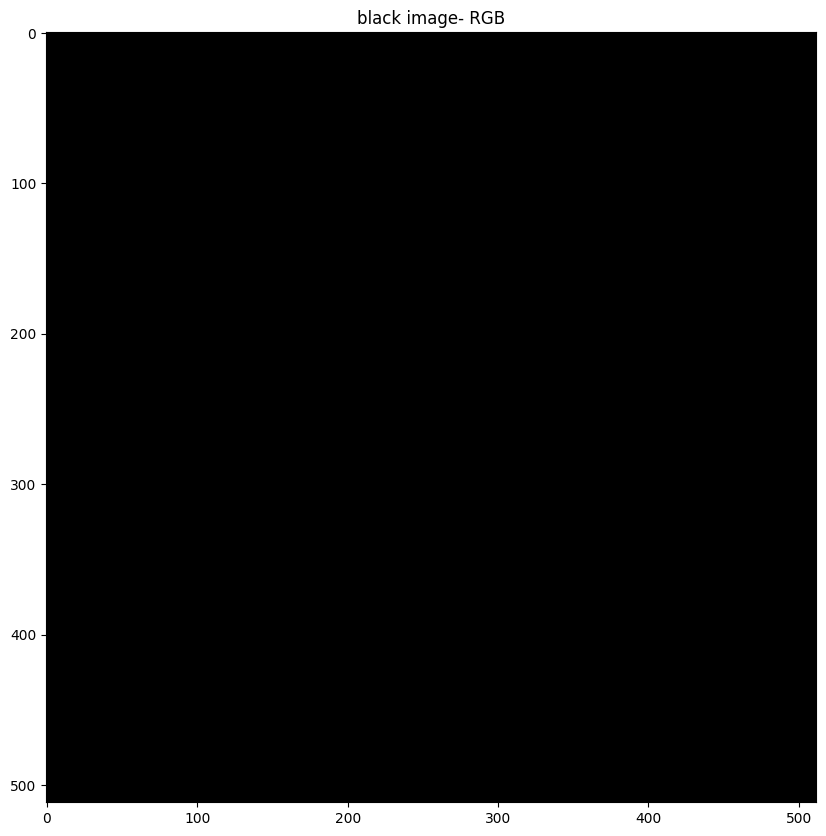

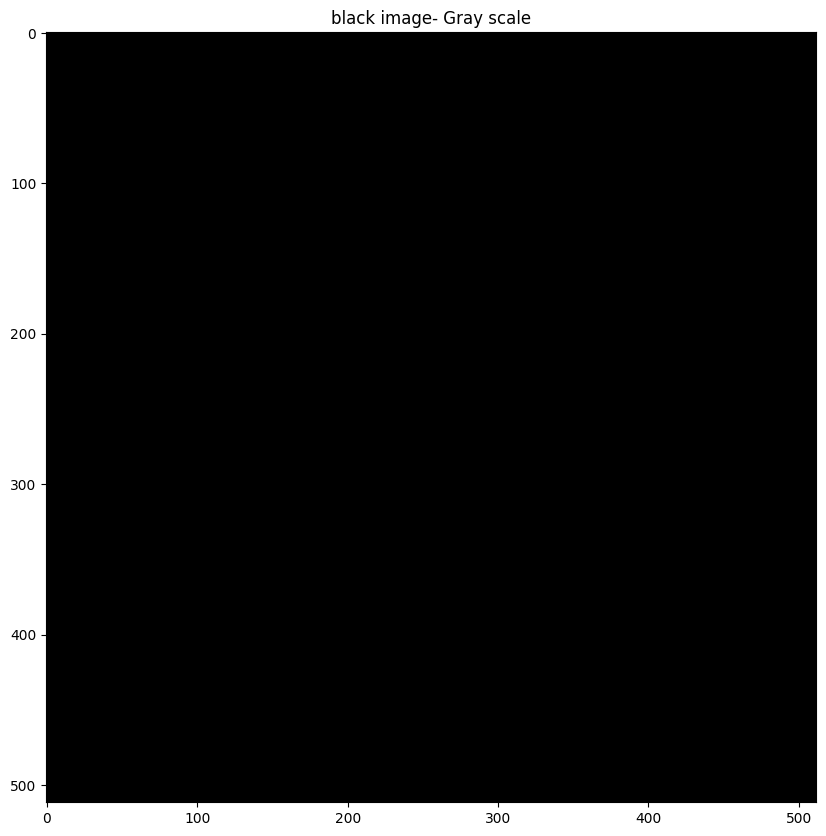

In [15]:
# black image using numpy
image = np.zeros((512,512,3), np.uint8)

# gray image using numpy
image_gray = np.zeros((512,512),np.uint8)

imshow("black image- RGB", image)
imshow("black image- Gray scale", image_gray)

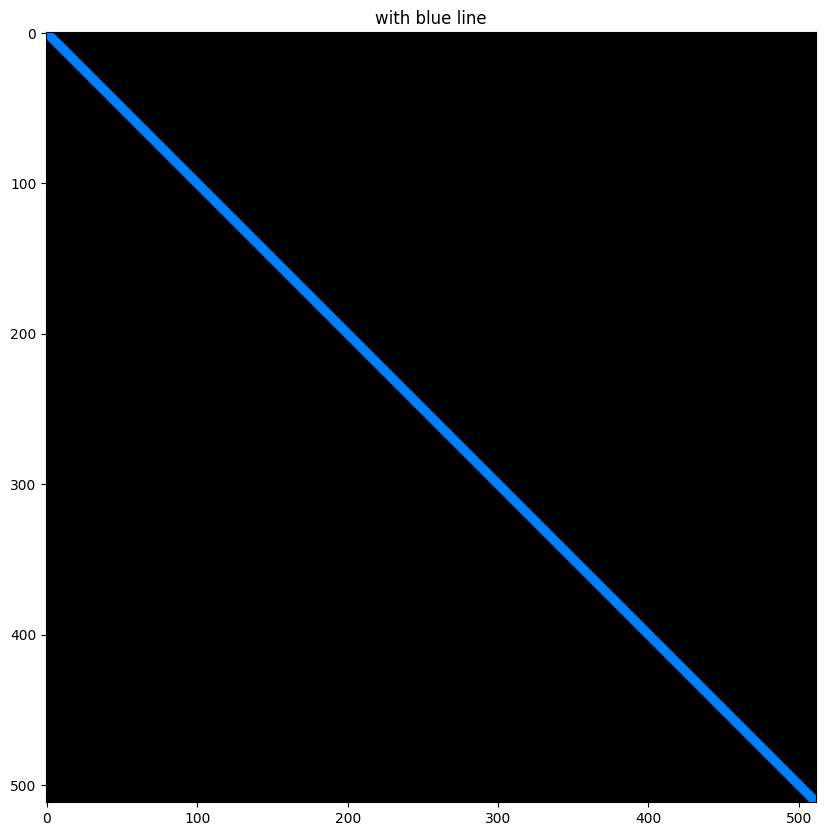

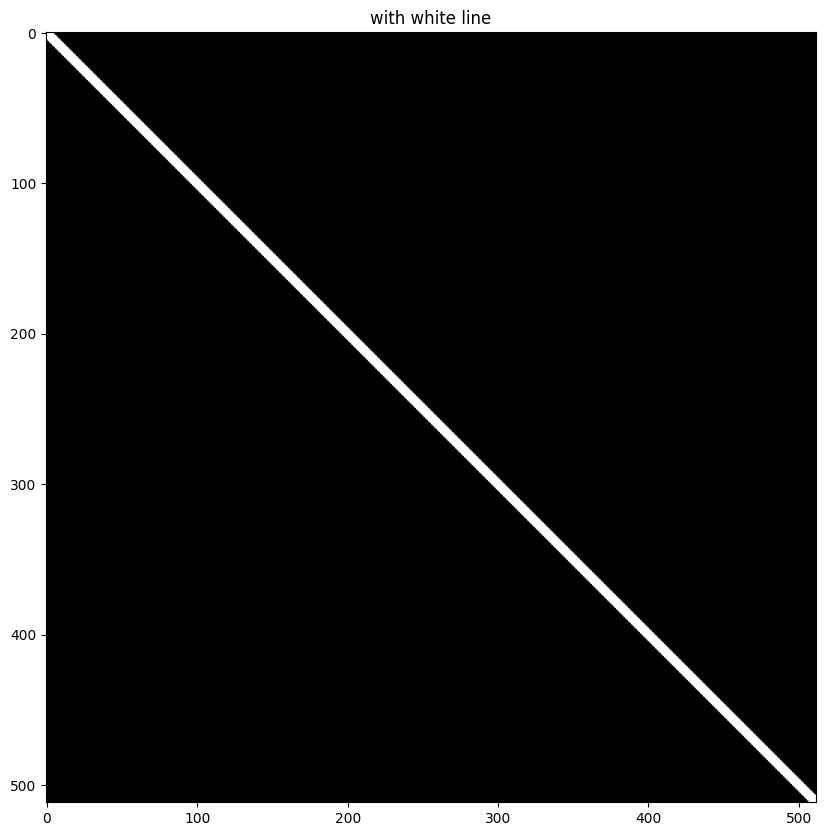

In [16]:
# draw line on both black canvas

cv2.line(image, (0,0), (511,511), (255,127,0), 5)
cv2.line(image_gray, (0,0), (511,511), 255, 5)

imshow("with blue line", image)
imshow("with white line", image_gray)

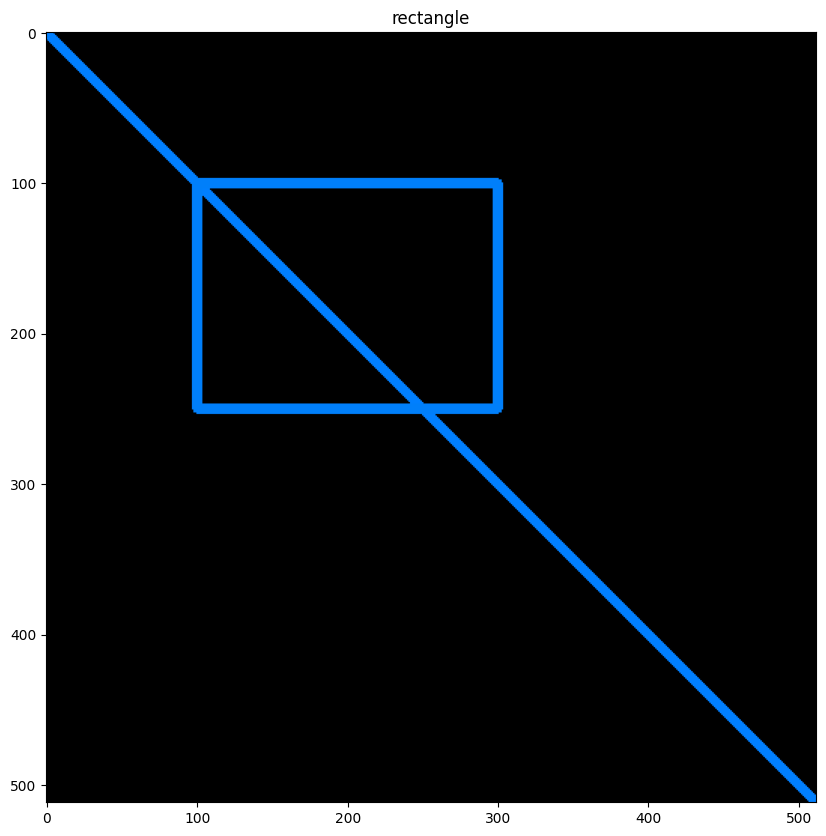

In [17]:
# draw rectangle

cv2.rectangle(image, (100,100), (300,250), (250,127,0), 5)
imshow("rectangle", image)

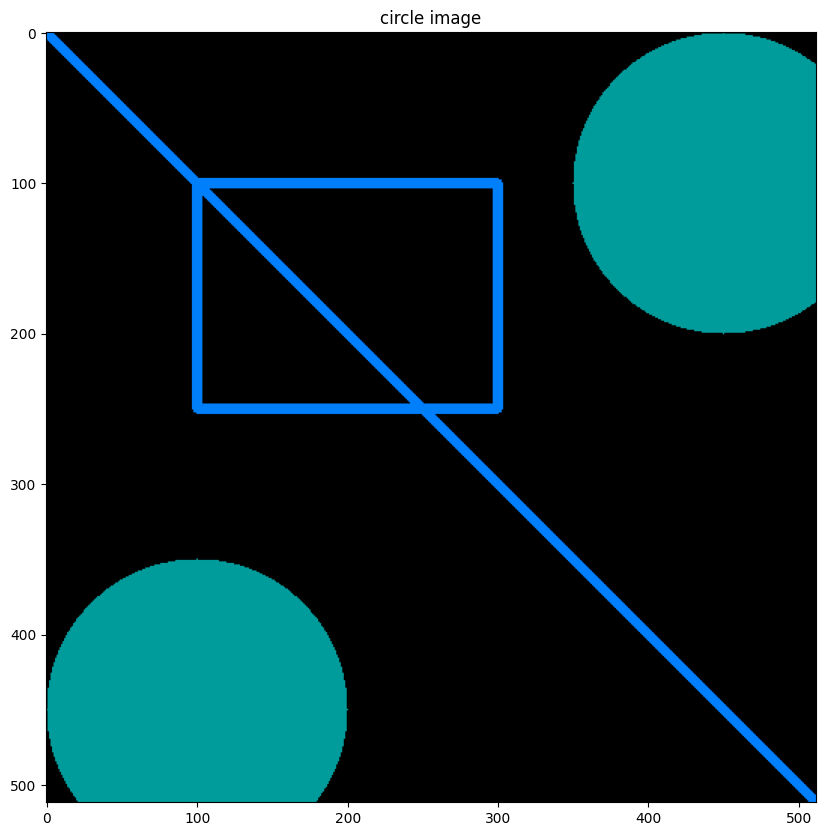

In [19]:
cv2.circle(image, (450,100), 100, (155,155,0), -1)
imshow("circle image", image)

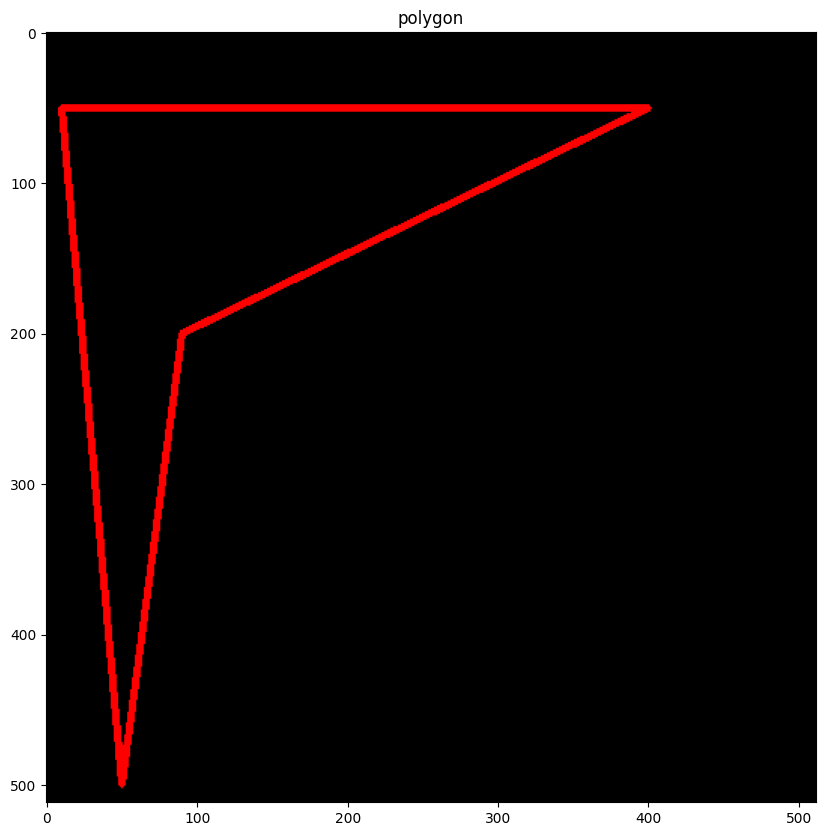

In [22]:
image = np.zeros((512,512,3), np.uint8)

pts = np.array([[10,50],[400,50], [90,200], [50, 500]],np.int32)

cv2.polylines(image, [pts], True, (0,0,255), 3)

imshow("polygon", image)

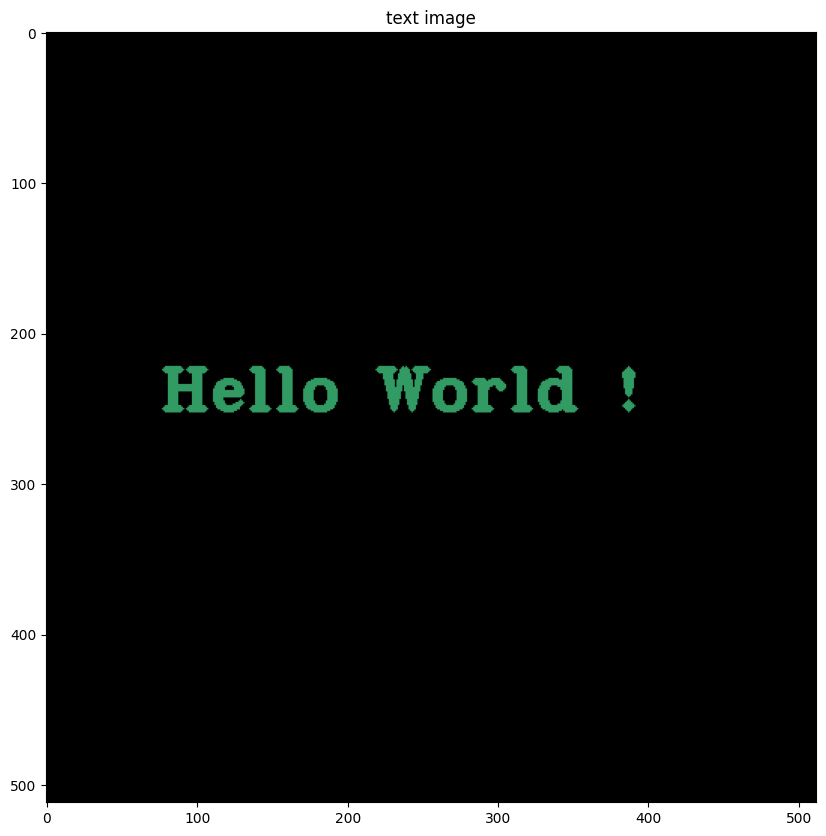

In [26]:
image = np.zeros((512,512,3), np.uint8)

cv2.putText(image, "Hello World !", (75,250), cv2.FONT_HERSHEY_COMPLEX_SMALL, 2, (100,155,50), 3)
imshow("text image", image)

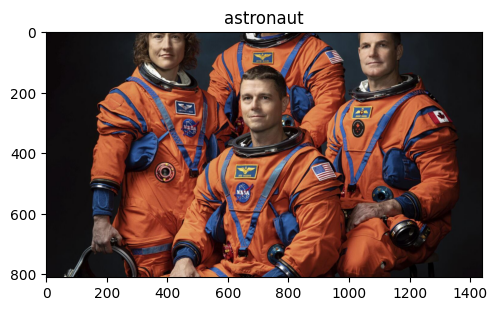

In [28]:
image = cv2.imread('/content/astronaut.jpeg')

imshow('astronaut', image)

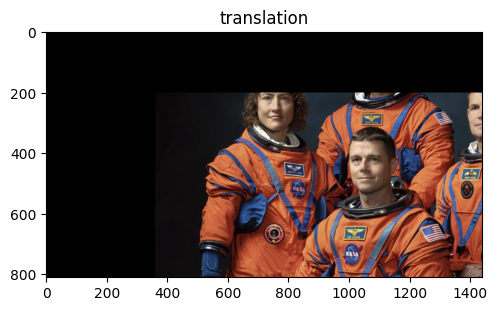

In [29]:
height , width = image.shape[:2]

# shift the image by quarter height and width

quarter_height , quarter_width = height /4 , width /4

T = np.float32([[1,0,quarter_width], [0,1,quarter_height]])

img_translation = cv2.warpAffine(image, T, (width, height))
imshow("translation", img_translation)

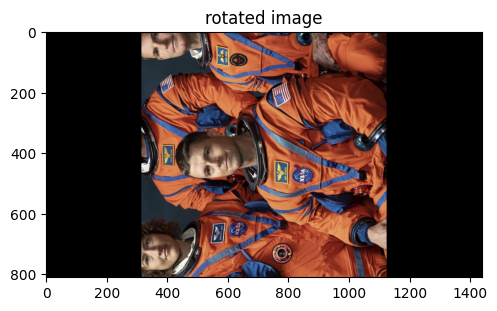

In [30]:
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 90, 1)

rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow("rotated image", rotated_image)

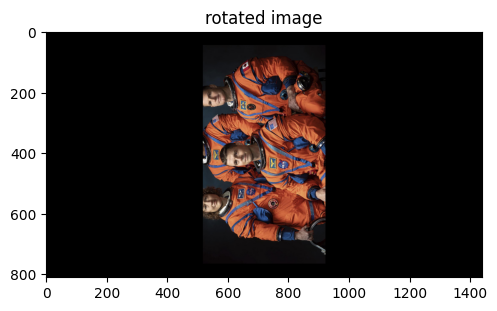

In [31]:
rotation_matrix = cv2.getRotationMatrix2D((width/2, height/2), 90, 0.5)

rotated_image = cv2.warpAffine(image, rotation_matrix, (width, height))
imshow("rotated image", rotated_image)

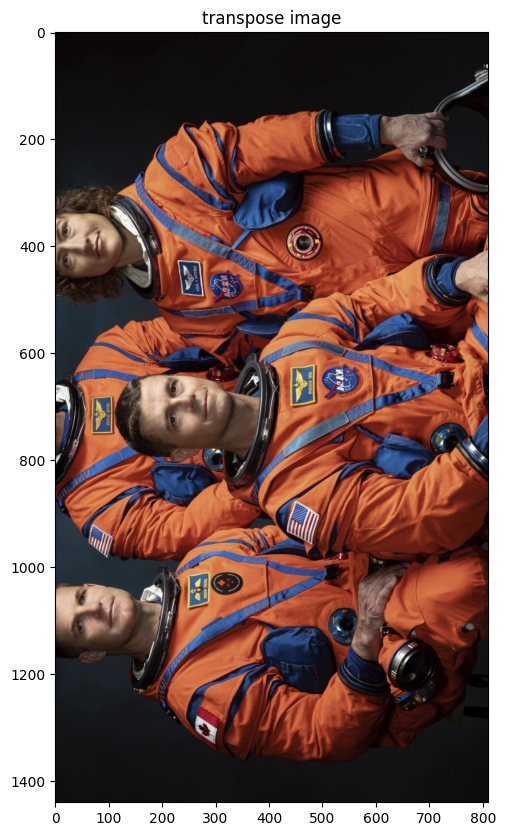

In [32]:
rotated_image = cv2.transpose(image)

imshow('transpose image', rotated_image)

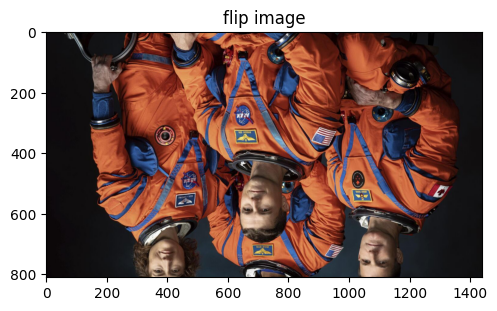

In [34]:
flip_image = cv2.flip(image, 0) # 0 for horizontal flip , 1 for vertical flip
imshow('flip image', flip_image)

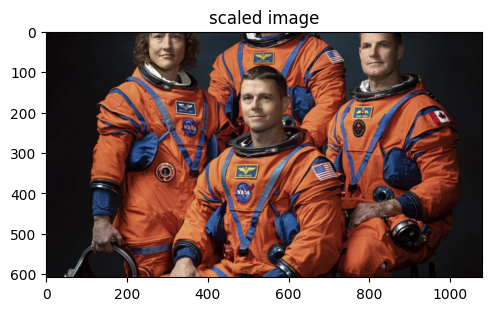

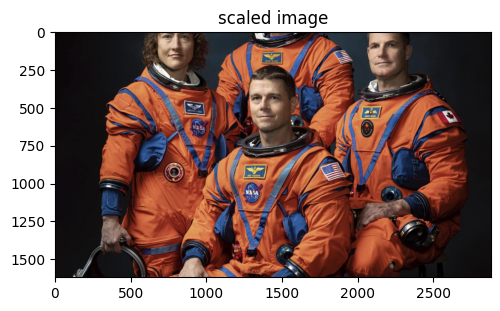

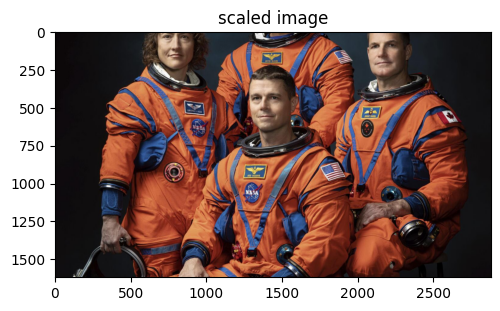

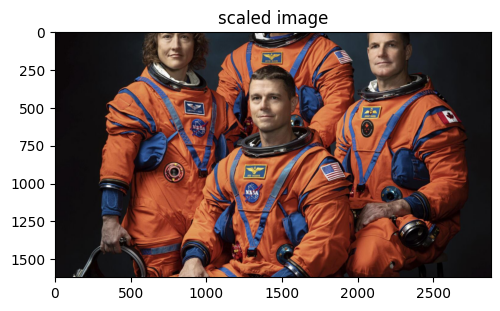

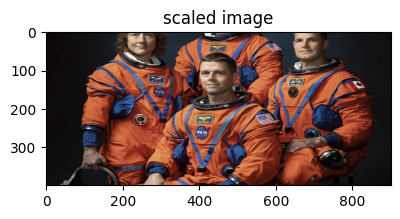

In [37]:
image_scaled = cv2.resize(image, None, fx = 0.75, fy = 0.75)
imshow('scaled image', image_scaled)

image_scaled2 = cv2.resize(image, None, fx = 2, fy = 2, interpolation = cv2.INTER_CUBIC)
imshow('scaled image', image_scaled2)

image_scaled3 = cv2.resize(image, None, fx = 2, fy = 2, interpolation = cv2.INTER_LANCZOS4)
imshow('scaled image', image_scaled3)

image_scaled4 = cv2.resize(image, None, fx = 2, fy = 2, interpolation = cv2.INTER_AREA)
imshow('scaled image', image_scaled4)

image_scaled5 = cv2.resize(image, (900,400), interpolation = cv2.INTER_NEAREST)
imshow('scaled image', image_scaled5)

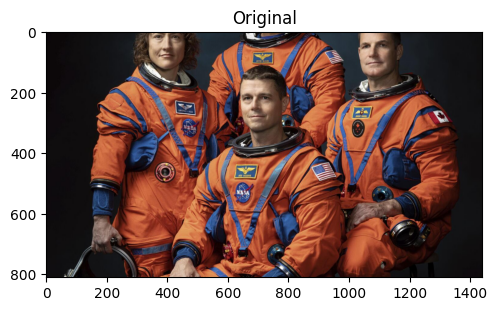

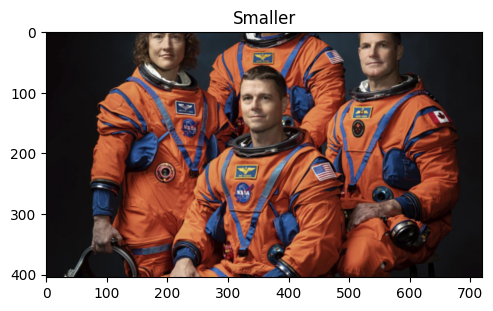

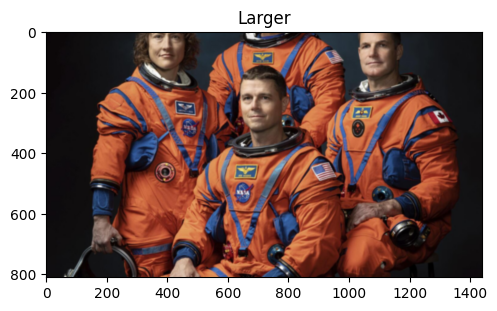

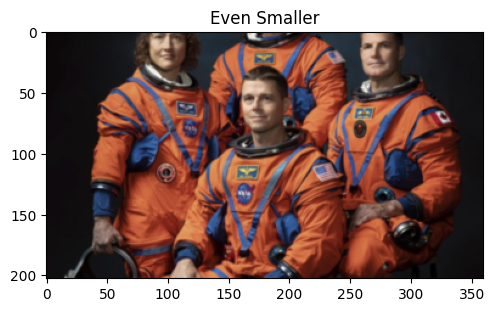

In [40]:
image = cv2.imread('/content/astronaut.jpeg')

smaller = cv2.pyrDown(image)
larger = cv2.pyrUp(smaller)

imshow("Original", image)
imshow('Smaller', smaller)
imshow('Larger', larger)

even_smaller = cv2.pyrDown(smaller)
imshow('Even Smaller', even_smaller)

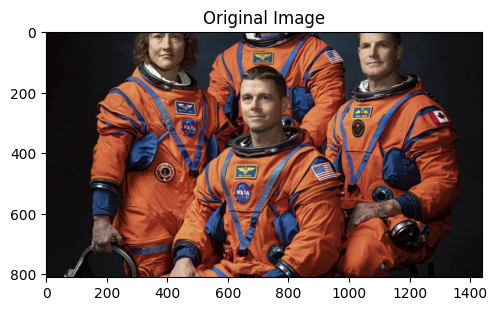

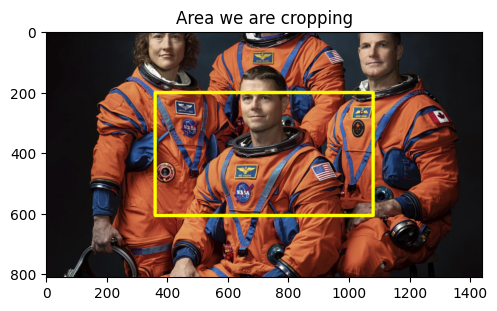

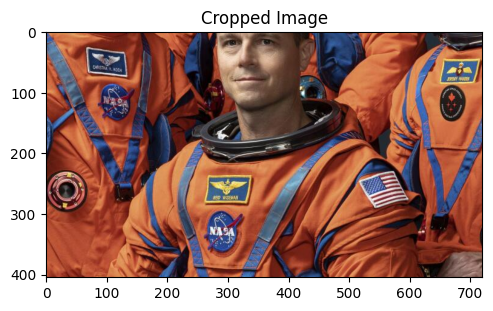

In [41]:
image = cv2.imread('/content/astronaut.jpeg')

# Get our image dimensions
height, width = image.shape[:2]

# Let's get the starting pixel coordiantes (top  left of cropping rectangle)
# using 0.25 to get the x,y position that is 1/4 down from the top left (0,0)
start_row, start_col = int(height * .25), int(width * .25)

# Let's get the ending pixel coordinates (bottom right)
end_row, end_col = int(height * .75), int(width * .75)

# Simply use indexing to crop out the rectangle we desire
cropped = image[start_row:end_row , start_col:end_col]

imshow("Original Image", image)

# The cv2.rectangle function draws a rectangle over our image (in-place operation)
copy = image.copy()
cv2.rectangle(copy, (start_col,start_row), (end_col,end_row), (0,255,255), 10)

imshow("Area we are cropping", copy)

imshow("Cropped Image", cropped)

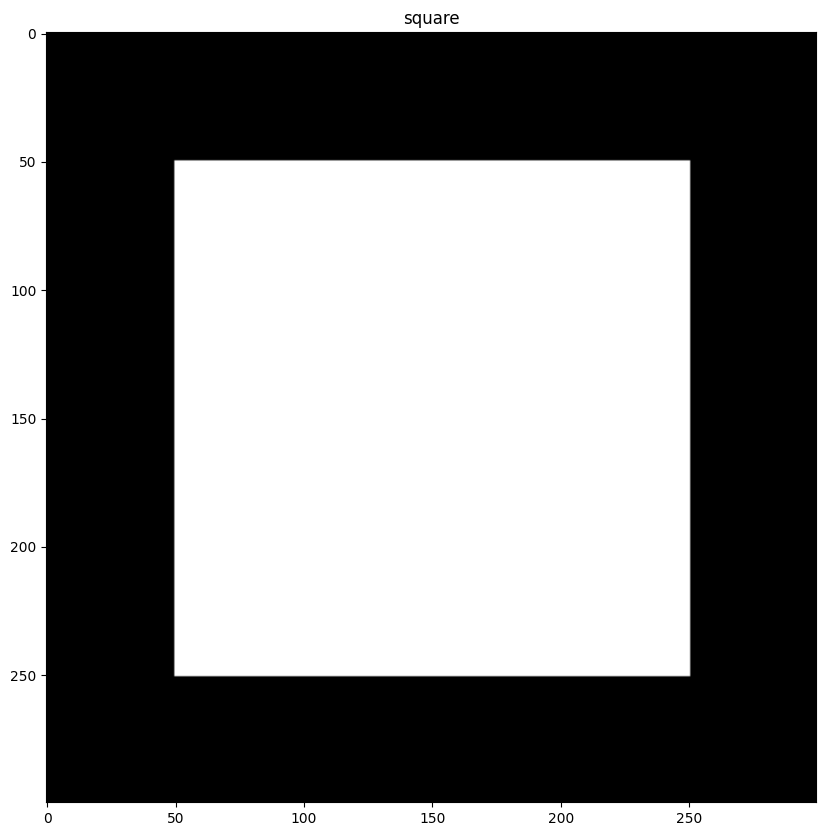

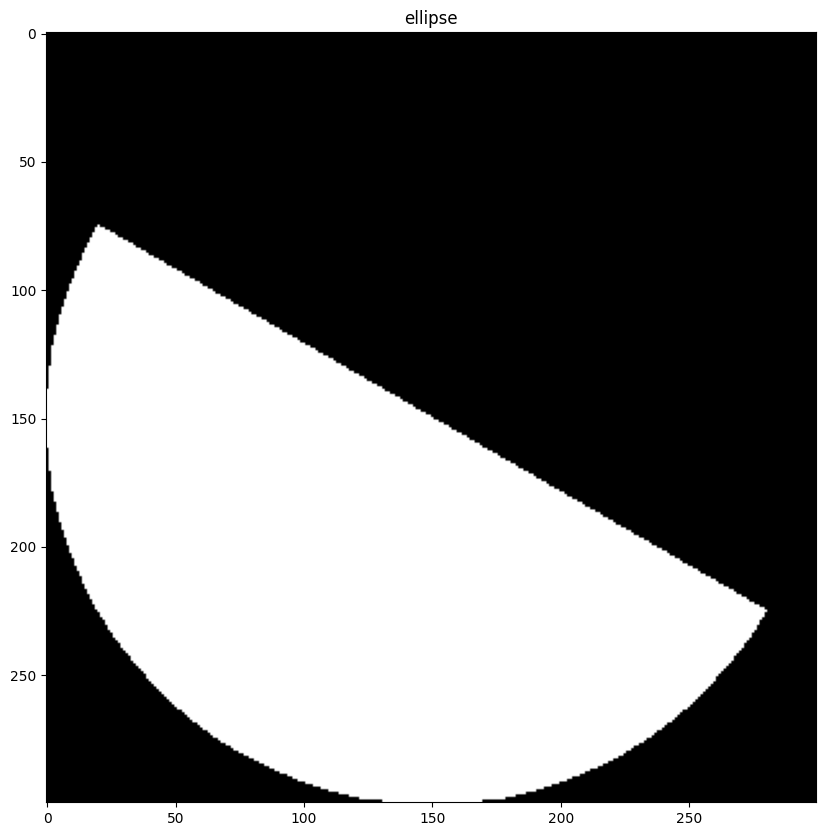

In [42]:
# Making a square
square = np.zeros((300, 300), np.uint8)
cv2.rectangle(square, (50, 50), (250, 250), 255, -2)
imshow("square", square)

# Making a ellipse
ellipse = np.zeros((300, 300), np.uint8)
cv2.ellipse(ellipse, (150, 150), (150, 150), 30, 0, 180, 255, -1)
imshow("ellipse", ellipse)

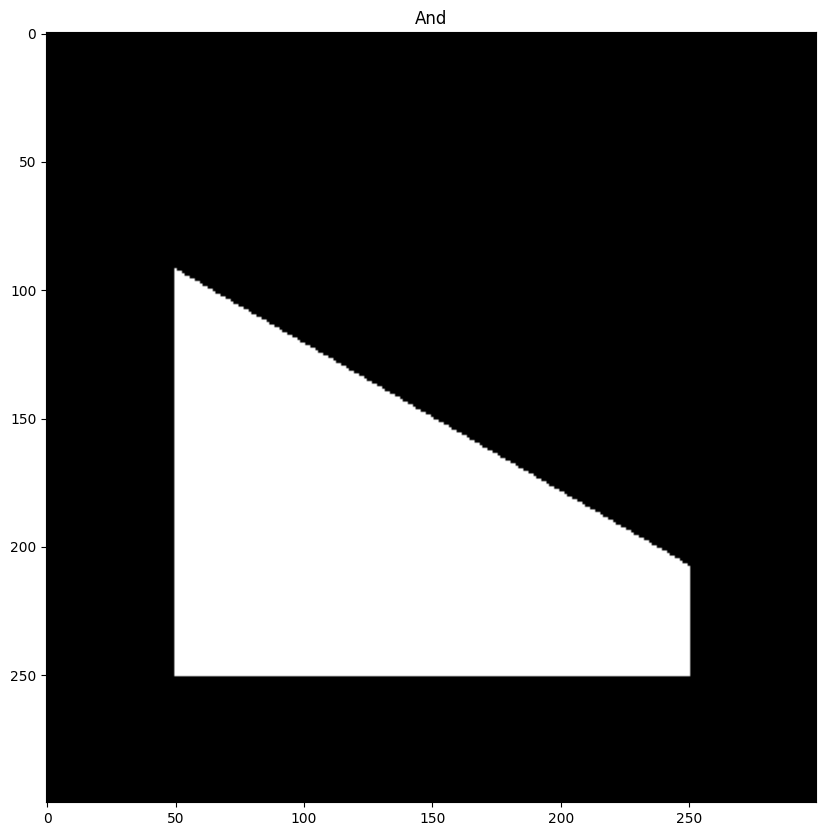

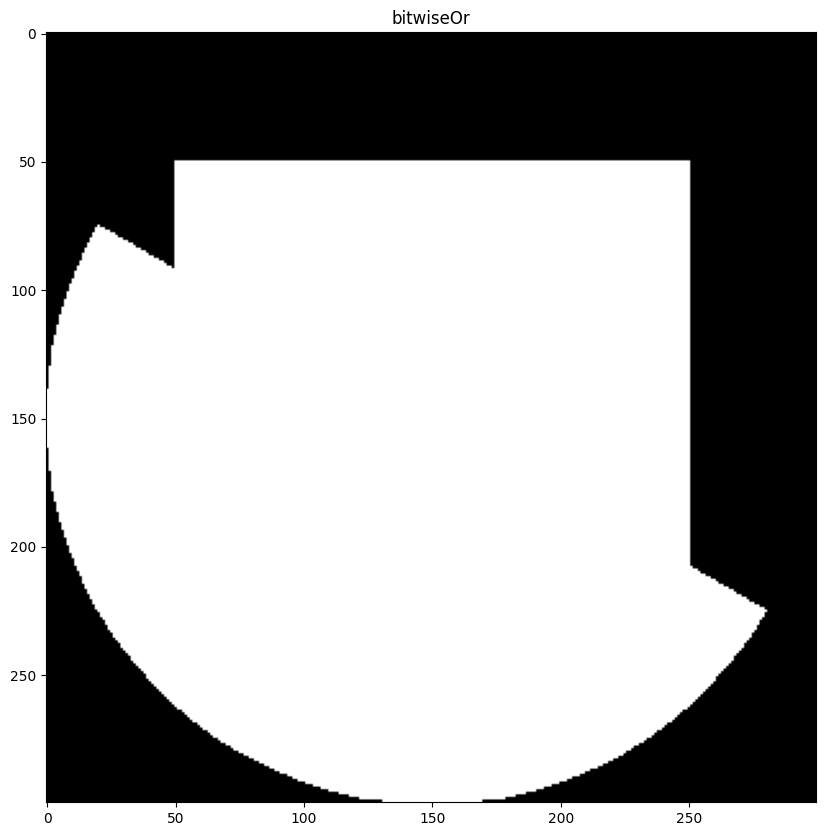

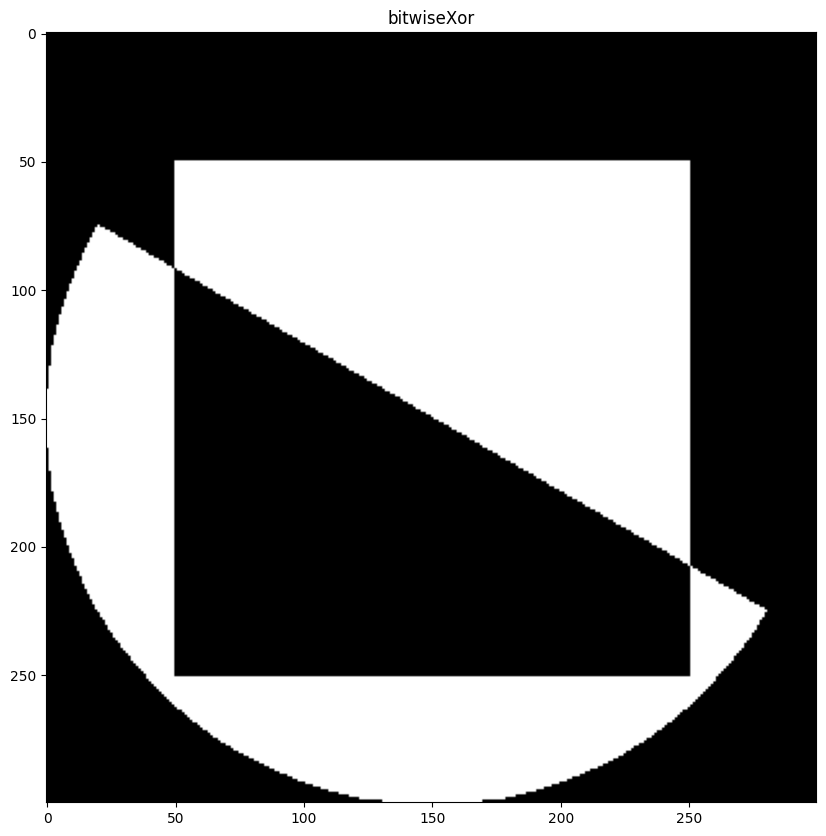

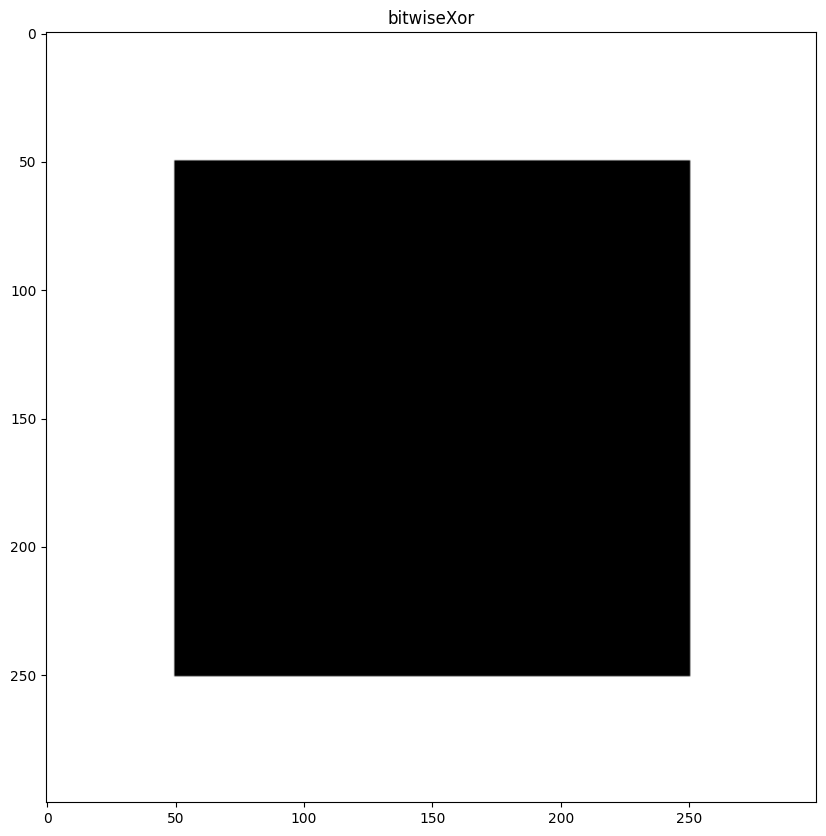

In [44]:
And = cv2.bitwise_and(square,ellipse)
imshow("And", And)

bitwiseOr = cv2.bitwise_or(square,ellipse)
imshow("bitwiseOr", bitwiseOr)

bitwiseXor = cv2.bitwise_xor(square,ellipse)
imshow("bitwiseXor", bitwiseXor)

bitwisenot = cv2.bitwise_not(square,ellipse)
imshow("bitwiseXor", bitwisenot)

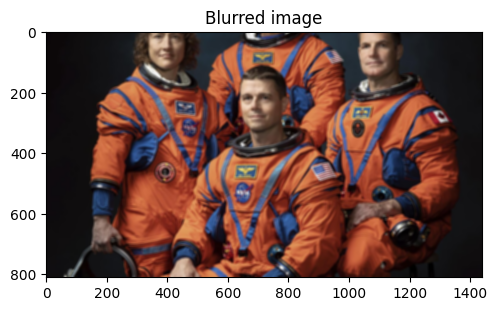

In [47]:
image = cv2.imread('/content/astronaut.jpeg')

kernel = np.ones((9,9), np.float32) /81

blurred = cv2.filter2D(image, -1, kernel)
imshow('Blurred image', blurred)

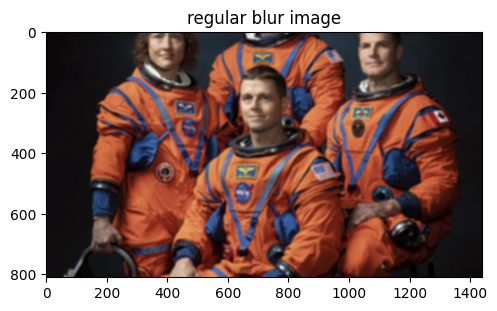

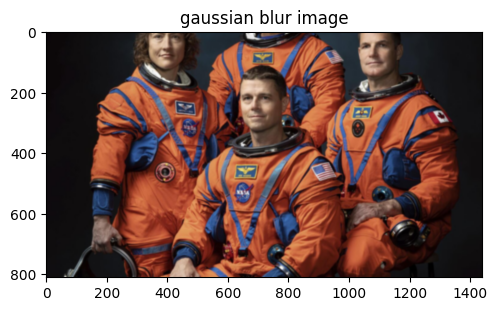

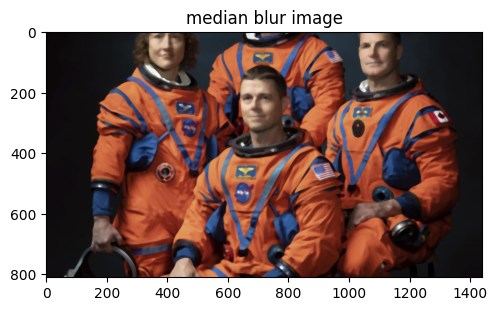

In [49]:
regular_blur = cv2.blur(image,(9,9))
imshow("regular blur image", regular_blur)

gaussian_blur = cv2.GaussianBlur(image,(9,9),0)
imshow("gaussian blur image", gaussian_blur)

median_blur = cv2.medianBlur(image,9)
imshow("median blur image", median_blur)

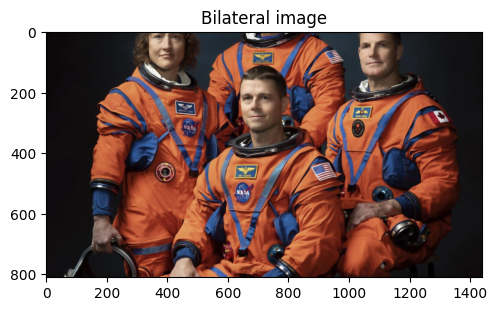

In [50]:
bilateral = cv2.bilateralFilter( image, 9, 75, 75)
imshow('Bilateral image', bilateral)

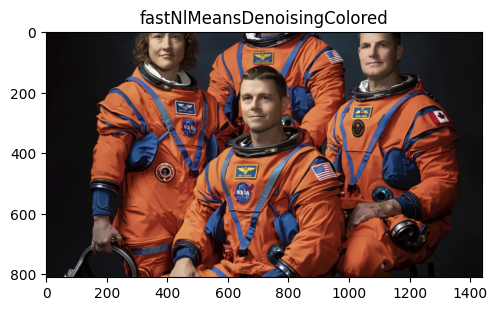

In [51]:
dst = cv2.fastNlMeansDenoisingColored(image, None, 6, 6, 7, 21)
imshow('fastNlMeansDenoisingColored', dst)


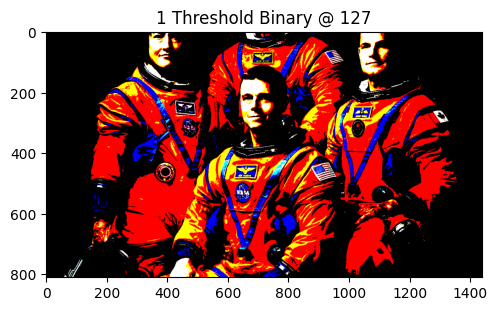

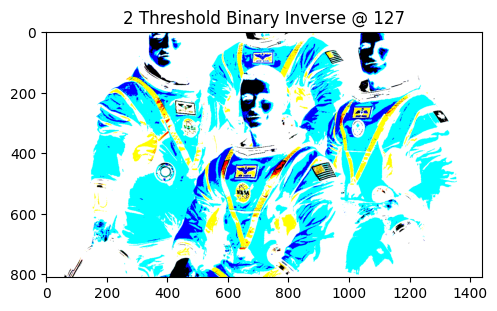

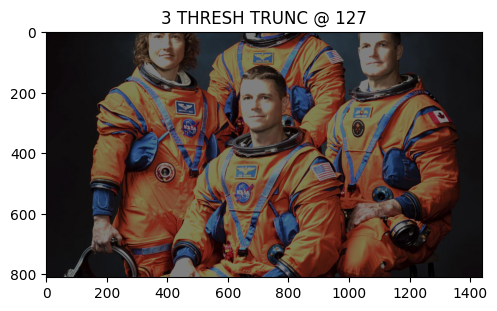

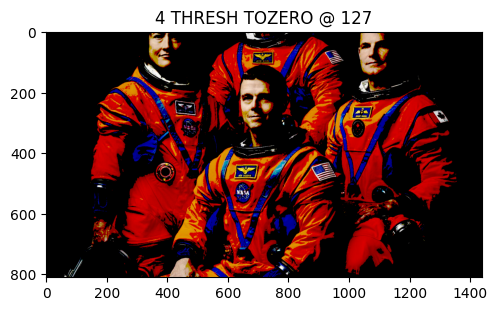

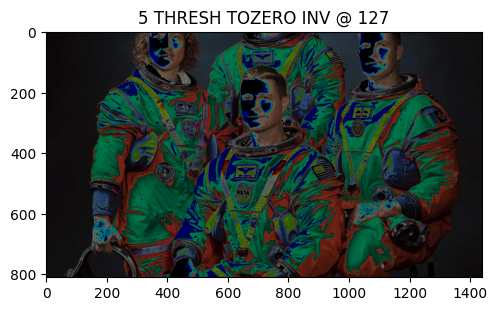

In [54]:
# Values below 127 goes to 0 or black, everything above goes to 255 (white)
ret,thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
imshow('1 Threshold Binary @ 127', thresh1)

# Values below 127 go to 255 and values above 127 go to 0 (reverse of above)
ret,thresh2 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY_INV)
imshow('2 Threshold Binary Inverse @ 127', thresh2)

# Values above 127 are truncated (held) at 127 (the 255 argument is unused)
ret,thresh3 = cv2.threshold(image, 127, 255, cv2.THRESH_TRUNC)
imshow('3 THRESH TRUNC @ 127', thresh3)

# Values below 127 go to 0, above 127 are unchanged
ret,thresh4 = cv2.threshold(image, 127, 255, cv2.THRESH_TOZERO)
imshow('4 THRESH TOZERO @ 127', thresh4)

# Reverse of the above, below 127 is unchanged, above 127 goes to 0
ret,thresh5 = cv2.threshold(image, 127, 255, cv2.THRESH_TOZERO_INV)
imshow('5 THRESH TOZERO INV @ 127', thresh5)





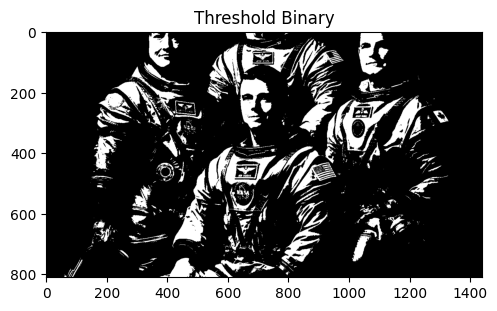

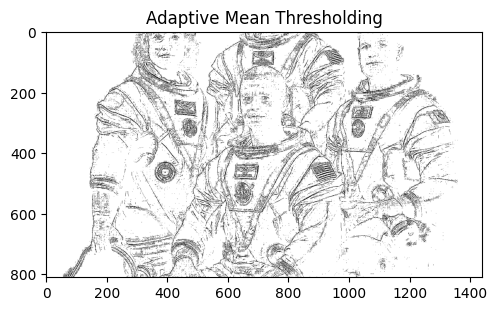

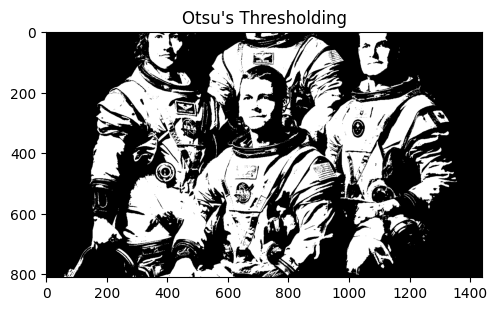

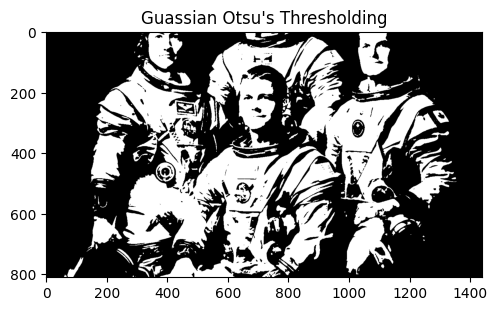

In [56]:
image = cv2.imread('/content/astronaut.jpeg',0)

# Values below 127 goes to 0 (black, everything above goes to 255 (white)
ret,thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
imshow('Threshold Binary', thresh1)

# It's good practice to blur images as it removes noise
#image = cv2.GaussianBlur(image, (3, 3), 0)

# Using adaptiveThreshold
thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, 5)
imshow("Adaptive Mean Thresholding", thresh)

_, th2 = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
imshow("Otsu's Thresholding", th2)

# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(image, (5,5), 0)
_, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
imshow("Guassian Otsu's Thresholding", th3)

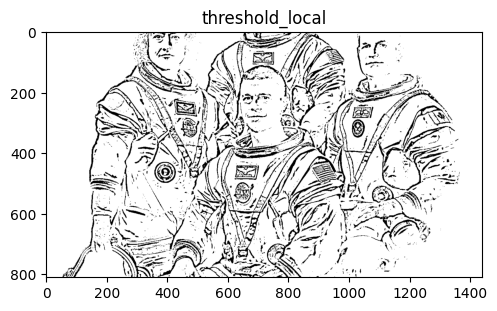

In [57]:
from skimage.filters import threshold_local
image = cv2.imread('/content/astronaut.jpeg')

# We get the Value component from the HSV color space
# then we apply adaptive thresholdingto
V = cv2.split(cv2.cvtColor(image, cv2.COLOR_BGR2HSV))[2]
T = threshold_local(V, 25, offset=15, method="gaussian")

# Apply the threshold operation
thresh = (V > T).astype("uint8") * 255
imshow("threshold_local", thresh)

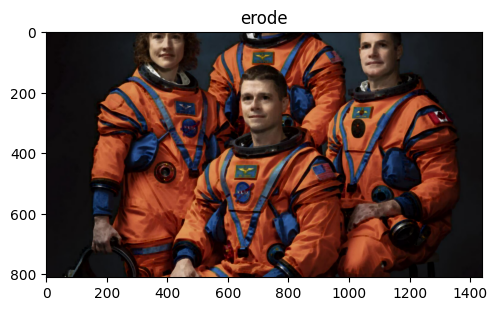

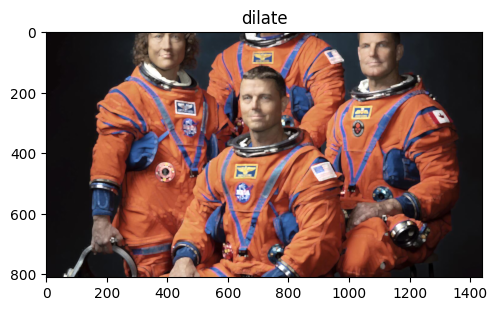

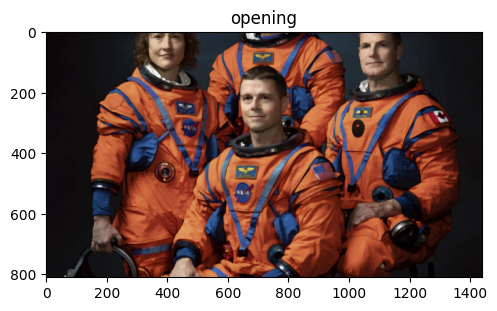

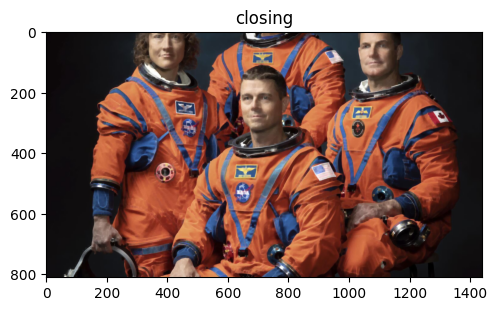

In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


image = cv2.imread('/content/astronaut.jpeg')

kernel = np.ones((5,5), np.uint8)

# erosion
erode = cv2.erode(image, kernel, iterations = 1)
imshow('erode', erode)

# dilate
dilate = cv2.dilate(image, kernel, iterations = 1)
imshow('dilate', dilate)

# opening
opening = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
imshow('opening', opening)

# closing
closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
imshow('closing', closing)

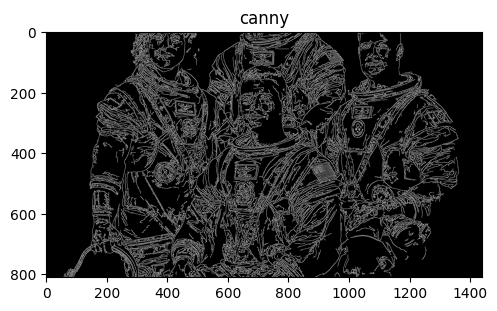

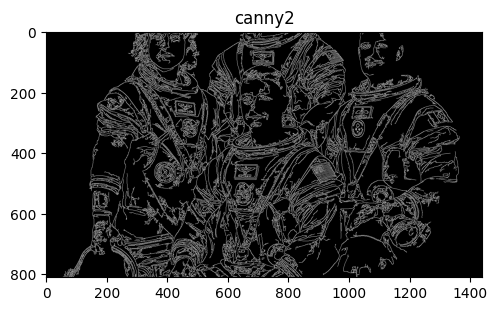

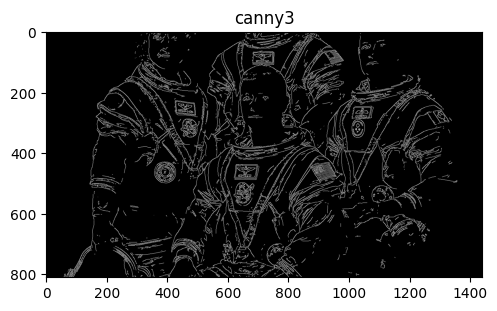

In [9]:
# canny edge detection

canny = cv2.Canny(image, 50, 120)
imshow('canny', canny)

# wide threshold lots of edges
canny2 = cv2.Canny(image, 10, 200)
imshow('canny2', canny2)

# tight threshold no edges
canny3 = cv2.Canny(image, 200, 240)
imshow('canny3', canny3)

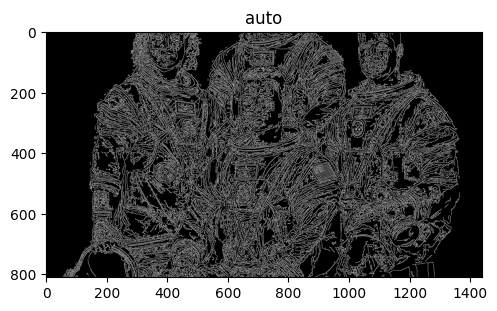

In [10]:
# autocanny

def autoCanny(image):
  median = np.median(image)
  lower = int(max(0, (1.0 - 0.33) * median))
  upper = int(min(255, (1.0 + 0.33) * median))
  edges = cv2.Canny(image = image, threshold1 = lower, threshold2 = upper)
  return edges

auto = autoCanny(image)
imshow('auto', auto)